Tancredi Bosi, 0001121897, tancredi.bosi@studio.unibo.it <br>
Francesco Farneti, 0001145280, francesco.farneti7@studio.unibo.it<br>
Luca Mercuriali, 0001139257, luca.mercuriali2@studio.unibo.it <br>

# **Product Recognition of Food Products**

## Image Processing and Computer Vision - Assignment Module \#1


Contacts:

- Prof. Giuseppe Lisanti -> giuseppe.lisanti@unibo.it
- Prof. Samuele Salti -> samuele.salti@unibo.it
- Alex Costanzino -> alex.costanzino@unibo.it
- Francesco Ballerini -> francesco.ballerini4@unibo.it


Computer vision-based object detection techniques can be applied in super market settings to build a system that can identify products on store shelves.
An example of how this system could be used would be to assist visually impaired customers or automate common store management tasks like detecting low-stock or misplaced products, given an image of a shelf in a store.

## Task
Develop a computer vision system that, given a reference image for each product, is able to identify such product from one picture of a store shelf.

<figure>
<a href="https://imgbb.com/">
  <center>
  <img src="https://i.ibb.co/TwkMWnH/Screenshot-2024-04-04-at-14-54-51.png" alt="Screenshot-2024-04-04-at-14-54-51" border="0" width="300" />
</a>
</figure>

For each type of product displayed in the
shelf the system should report:
1. Number of instances;
1. Dimension of each instance (width and height in pixel of the bounding box that enclose them);
1. Position in the image reference system of each instance (center of the bounding box that enclose them).

#### Example of expected output
```
Product 0 - 2 instance found:
  Instance 1 {position: (256, 328), width: 57px, height: 80px}
  Instance 2 {position: (311, 328), width: 57px, height: 80px}
Product 1 – 1 instance found:
.
.
.
```

### Track A - Single Instance Detection
Develop an object detection system to identify single instance of products given one reference image for each item and a scene image.

The system should be able to correctly identify all the product in the shelves
image.

### Track B - Multiple Instances Detection
In addition to what achieved at step A, the system should also be able to detect multiple instances of the same product.

## Data
Two folders of images are provided:
* **Models**: contains one reference image for each product that the system should be able to identify.
* **Scenes**: contains different shelve pictures to test the developed algorithm in different scenarios. The images contained in this folder are corrupted by noise.

#### Track A - Single Instance Detection
* **Models**: {ref1.png to ref14.png}.
* **Scenes**: {scene1.png to scene5.png}.

#### Track B - Multiple Instances Detection
* **Models**: {ref15.png to ref27.png}.
* **Scenes**: {scene6.png to scene12.png}.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

!cp -r /content/drive/MyDrive/AssignmentsIPCV/dataset.zip ./
!unzip dataset.zip

Mounted at /content/drive
Archive:  dataset.zip
   creating: dataset/
  inflating: __MACOSX/._dataset      
   creating: dataset/scenes/
  inflating: __MACOSX/dataset/._scenes  
  inflating: dataset/.DS_Store       
  inflating: __MACOSX/dataset/._.DS_Store  
   creating: dataset/models/
  inflating: __MACOSX/dataset/._models  
  inflating: dataset/scenes/scene12.png  
  inflating: __MACOSX/dataset/scenes/._scene12.png  
  inflating: dataset/scenes/scene10.png  
  inflating: __MACOSX/dataset/scenes/._scene10.png  
  inflating: dataset/scenes/scene11.png  
  inflating: __MACOSX/dataset/scenes/._scene11.png  
  inflating: dataset/scenes/scene5.png  
  inflating: __MACOSX/dataset/scenes/._scene5.png  
  inflating: dataset/scenes/scene4.png  
  inflating: __MACOSX/dataset/scenes/._scene4.png  
  inflating: dataset/scenes/scene6.png  
  inflating: __MACOSX/dataset/scenes/._scene6.png  
  inflating: dataset/scenes/scene7.png  
  inflating: __MACOSX/dataset/scenes/._scene7.png  
  inflating: 

## Evaluation criteria
1. **Procedural correctness**. There are several ways to solve the assignment. Design your own sound approach and justify every decision you make;

2. **Clarity and conciseness**. Present your work in a readable way: format your code and comment every important step;

3. **Correctness of results**. Try to solve as many instances as possible. You should be able to solve all the instances of the assignment, however, a thoroughly justified and sound procedure with a lower number of solved instances will be valued **more** than a poorly designed approach.

# TRACK A

## Importing useful libraries

In [ ]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
import math

## Let's take a look to some images

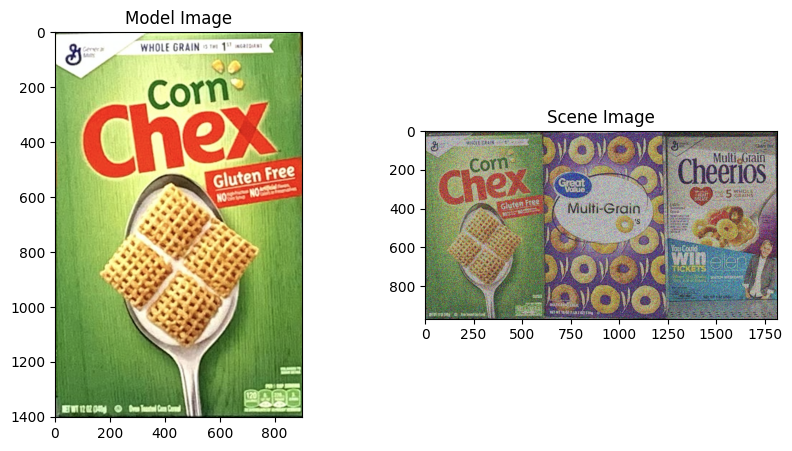

In [ ]:
query_example = cv2.imread('dataset/models/ref3.png', cv2.IMREAD_COLOR)
query_example = cv2.cvtColor(query_example, cv2.COLOR_BGR2RGB)
train_example = cv2.imread('dataset/scenes/scene2.png', cv2.IMREAD_COLOR)
train_example = cv2.cvtColor(train_example, cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(query_example)
axes[0].set_title('Model Image')
axes[1].imshow(train_example)
axes[1].set_title('Scene Image')
plt.show()

We can see that scene images are a lot noisy.<br>
We suppose that there is salt and pepper noise and some Gaussian noise.<br>
We decided to clean the images appling two median filters for the impulse noise with a small kernel (3) and a Non-Local Means Filter to reduce the Gaussian noise preserving edges.

In [ ]:
def clean_image(img):
    filtered_image = cv2.medianBlur(img, 3)
    filtered_image = cv2.medianBlur(filtered_image, 3)
    filtered_image = cv2.fastNlMeansDenoisingColored(filtered_image, None, 7, 7, 3, 21)
    return filtered_image

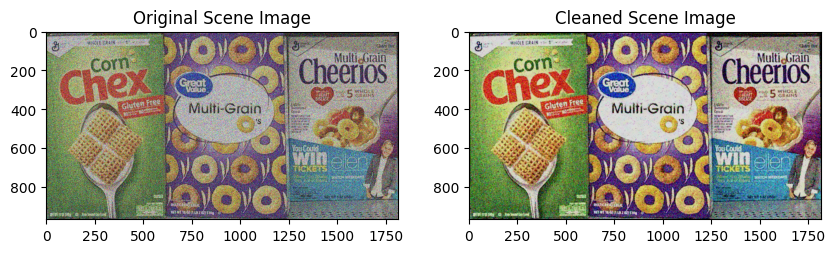

In [ ]:
train_example_clean = clean_image(train_example)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(train_example)
axes[0].set_title('Original Scene Image')
axes[1].imshow(train_example_clean)
axes[1].set_title('Cleaned Scene Image')
plt.show()

## Loading model images and scene images

In [ ]:
imgs_query_task1A_rgb = []

for i in range(1, 15):
    img_query_bgr = cv2.imread(f'dataset/models/ref{i}.png', cv2.IMREAD_COLOR)
    img_query_rgb = cv2.cvtColor(img_query_bgr, cv2.COLOR_BGR2RGB)
    imgs_query_task1A_rgb.append(img_query_rgb)

imgs_train_task1A_rgb = []

for i in range(1, 6):
    img_train_bgr = cv2.imread(f'dataset/scenes/scene{i}.png', cv2.IMREAD_COLOR)
    img_train_rgb = cv2.cvtColor(img_train_bgr, cv2.COLOR_BGR2RGB)
    filtered_image = clean_image(img_train_rgb)
    imgs_train_task1A_rgb.append(filtered_image)

## Object Retrieve Algorithm
Definition of the function that:
 - uses SIFT to find keypoints and descriptors on query and train images
 - uses Flann to find matches with knn
 - calculates the min matches constraint as 1% of the matches found
 - takes the good matches
 - if the number of matches is enough:
  - estimates a good homography using RANSAC
  - finds the corners of the query image
  - projects the corners in the scene image
  - warps the query image with the homography
  - crops the corresponding region from the scene image (bounding box)
  - performs template matching between the cropped area and the warped image
  - applies a threshold for template matching (empirically we found that 0.93 was a good choice)
  - if the template matching passes, calculates the center, width and height of the bounding box
  -  returns a tuple necessary for the plotting part

- if the number of good matches is not enough or the template matching does not pass the threshold, the function returns a tuple with as first element a "-1".

In [ ]:
def object_retrieve(img_query, img_train):

    # SIFT detector
    sift = cv2.xfeatures2d.SIFT_create(edgeThreshold=25, contrastThreshold=0.025)

    img_train = img_train.copy()

    # Find keypoints and descriptors of the query and train images
    kp_query, des_query = sift.detectAndCompute(img_query, None)
    kp_train, des_train = sift.detectAndCompute(img_train, None)

    # Flann matcher
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=50)
    search_params = dict(checks=500)

    # Find the matches
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    matches = flann.knnMatch(des_query, des_train, k=2)

    # Calculate the minimum number of matches required for this query image for this scene image
    min_match_count_calc = 1 * len(matches) / 100

    # Good matches
    good = []
    for m, n in matches:
        if m.distance < 0.7 * n.distance:
            good.append(m)

    if len(good) > min_match_count_calc:
        src_pts = np.float32([kp_query[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp_train[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

        # RANSAC to estimate a robust homography
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

        if M is None:
            return -1, kp_query, kp_train, good, None, None, None

        matchesMask = mask.ravel().tolist()

        # Corners of the query image
        h, w, p = img_query.shape
        pts = np.float32([[0, 0], [0, h - 1], [w - 1, h - 1], [w - 1, 0]]).reshape(-1, 1, 2)

        # Projecting the corners into the train image
        dst = cv2.perspectiveTransform(pts, M)

        # Warp the query image based on the homography
        warped_query = cv2.warpPerspective(img_query, M, (img_train.shape[1], img_train.shape[0]))

        # Create mask for the area of interest in train image (bounding box)
        mask = np.zeros(img_train.shape[:2], dtype=np.uint8)
        cv2.fillPoly(mask, [np.int32(dst)], 255)

        # Crop the corresponding region from the train image
        train_area = cv2.bitwise_and(img_train, img_train, mask=mask)

        # Template matching between the warped query and train area
        res = cv2.matchTemplate(train_area, warped_query, cv2.TM_CCOEFF_NORMED)
        _, max_val, _, _ = cv2.minMaxLoc(res)

        # Template matching threshold
        if max_val < 0.93:
            return -1, kp_query, kp_train, good, None, None, None


        img_train_p = cv2.polylines(img_train, [np.int32(dst)], True, (0, 255, 0), 20, cv2.LINE_AA)

        # Center of the bounding box
        center_x = int(np.mean(dst[:, :, 0]))
        center_y = int(np.mean(dst[:, :, 1]))

        # Width and Height of the bounding box
        width = np.max(dst[:, :, 0]) - np.min(dst[:, :, 0])
        height = np.max(dst[:, :, 1]) - np.min(dst[:, :, 1])

        dic_out = {}
        dic_out['position'] = (center_x, center_y)
        dic_out['width'] = width
        dic_out['height'] = height

        # Return a tuple with all the necessary things that we will use
        return len(good), kp_query, kp_train, good, matchesMask, img_train_p, dic_out

    else:
        matchesMask = None
        return -1, kp_query, kp_train, good, matchesMask, None, None


## Results and the achieved score

In [ ]:
def evaluate_resultsA(train_imgs, query_imgs):
  res = []
  images_res = []

  for j, train in enumerate(train_imgs):
    print('SCENE', j)
    scene_res = []
    img_res = []
    for i, query in enumerate(query_imgs):
        found = object_retrieve(query, train)
        if found[0] > 0:
            print('Product ', i, ' - 1 instance found:', sep='')
            print('\tInstance 1', found[-1])
            scene_res.append(i)
            img_res.append(found[-2])
    res.append(scene_res)
    images_res.append(img_res)
    print('\n')

  return res, images_res

In [ ]:
resultsA, res_scene_imagesA = evaluate_resultsA(imgs_train_task1A_rgb, imgs_query_task1A_rgb)

SCENE 0
Product 0 - 1 instance found:
	Instance 1 {'position': (411, 538), 'width': 803.3526, 'height': 1049.9996}
Product 1 - 1 instance found:
	Instance 1 {'position': (1247, 533), 'width': 802.20386, 'height': 1049.6713}


SCENE 1
Product 2 - 1 instance found:
	Instance 1 {'position': (304, 492), 'width': 605.88696, 'height': 941.77246}
Product 3 - 1 instance found:
	Instance 1 {'position': (927, 483), 'width': 632.4481, 'height': 949.81494}
Product 4 - 1 instance found:
	Instance 1 {'position': (1528, 450), 'width': 560.3789, 'height': 843.99054}


SCENE 2
Product 5 - 1 instance found:
	Instance 1 {'position': (298, 458), 'width': 601.0363, 'height': 672.1626}
Product 6 - 1 instance found:
	Instance 1 {'position': (888, 460), 'width': 542.3416, 'height': 650.499}
Product 7 - 1 instance found:
	Instance 1 {'position': (1446, 396), 'width': 561.6378, 'height': 782.7243}


SCENE 3
Product 0 - 1 instance found:
	Instance 1 {'position': (887, 914), 'width': 382.19244, 'height': 514.7705

The score is calculated as:
- +1: if the model found in a scene is correct
- 0: if a model was not found in a scene<br>

The errors are the number of objects that were found, but we did not expected them to be.

Note: if a model is found in a scene and it should be, but the box is not in the right position, the score doesn't catch it. But, in this TaskA, this error does not occur in our case.

In [ ]:
def print_resultA(results, gt):
  boxes_found = 0
  errors = 0
  total = sum(1 for j in range(len(gt)) for i in gt[j])
  for i in range(len(results)):
    for e in GROUND_TRUTH_A[i]:
      if e in results[i]:
        boxes_found += 1
      else:
        errors += 1
    for e in results[i]:
      if e not in GROUND_TRUTH_A[i]:
        errors += 1

  print(f'Boxes found: {boxes_found}/{total}')
  print('Errors:', errors)

In [ ]:
GROUND_TRUTH_A = [[0,1], [2,3,4], [5,6,7], [0,7,8,9], [10,11]]

print_resultA(resultsA, GROUND_TRUTH_A)

Boxes found: 14/14
Errors: 0


We achieve a perfect score, so the algorithm performs well.

SCENE: 0


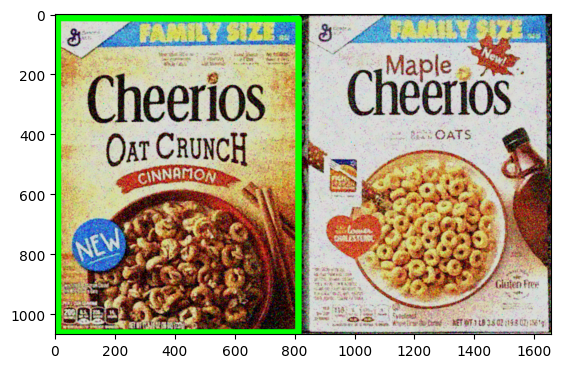

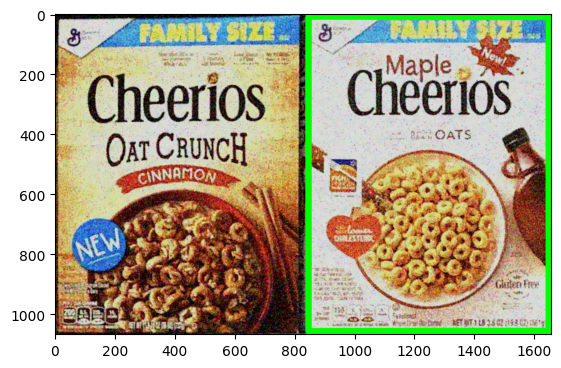


SCENE: 1


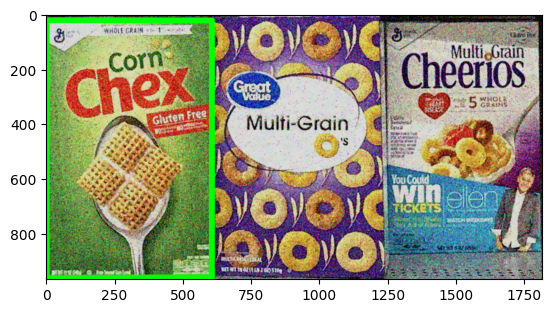

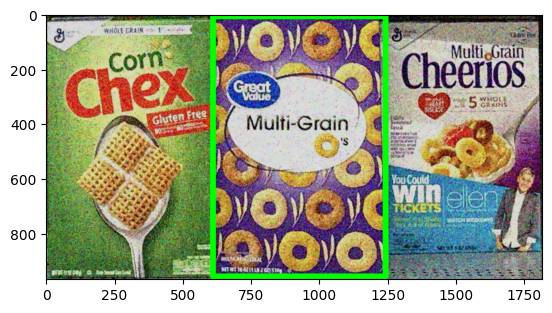

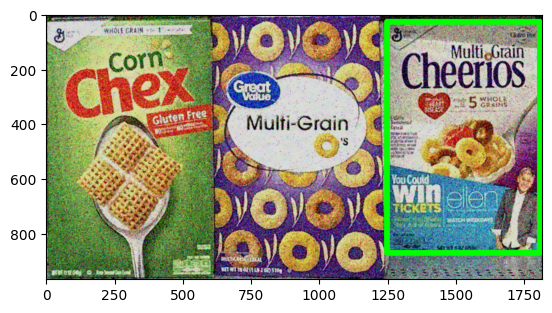


SCENE: 2


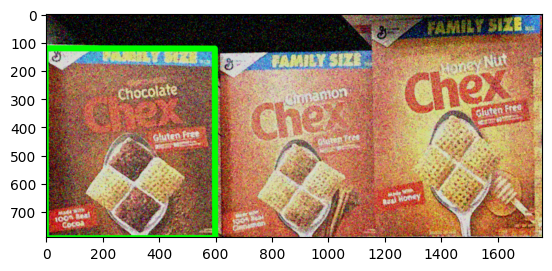

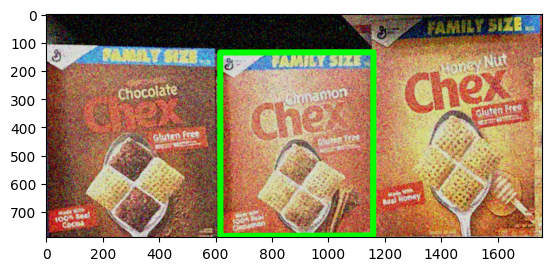

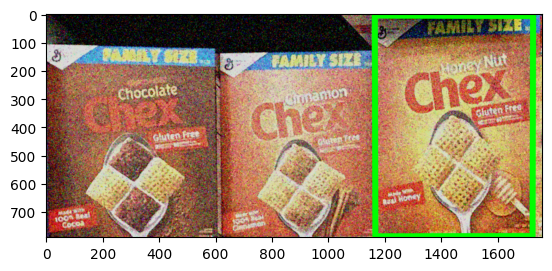


SCENE: 3


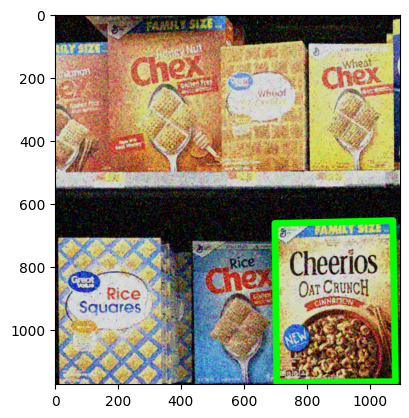

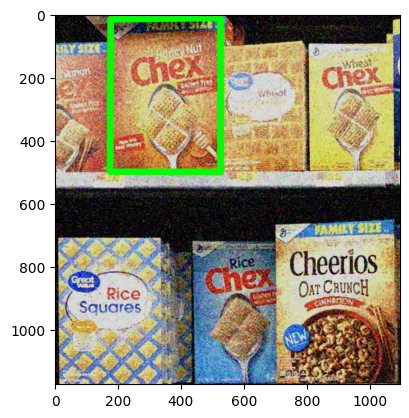

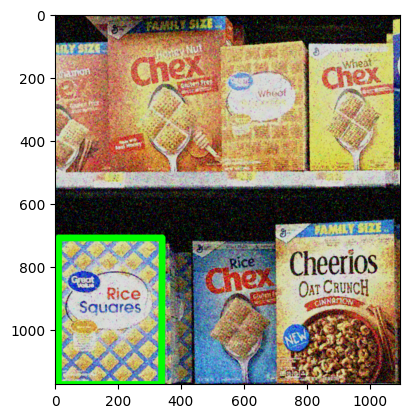

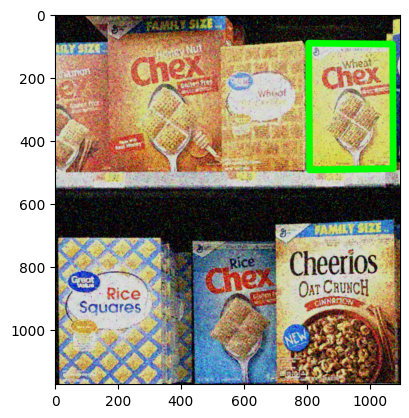


SCENE: 4


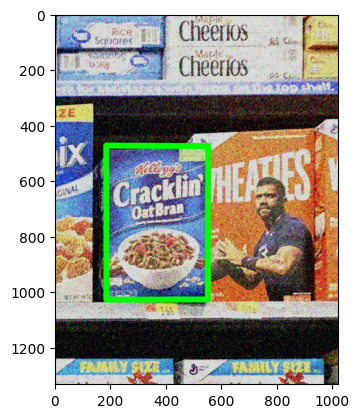

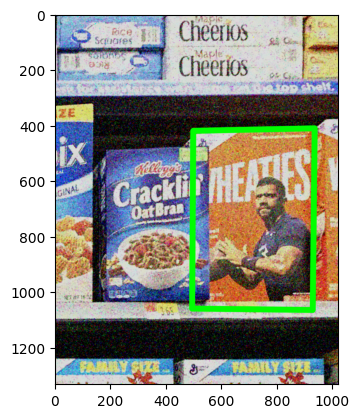

In [ ]:
for i, single_image_res in enumerate(res_scene_imagesA):
  print("SCENE:", i)
  for sir in single_image_res:
    plt.imshow(sir)
    plt.show()

  print()

# TRACK B

## Image cleaning
We applied a different sequence of filters for the taskB, because we noted that some scene images presented less clours and were very difficult to process being white. So we applied two strong median filters, one Non-Local Means filter and a sharpening kernel.

In [ ]:
def sharpen_image(image, amount=1):
  kernel = np.array([[-1, -1, -1],
                      [-1,  9, -1],
                      [-1, -1, -1]]) * amount

  sharpened = cv2.filter2D(image, -1, kernel)

  return sharpened

def filter_image(image):
  filtered_image = cv2.medianBlur(image, 7)
  filtered_image = cv2.medianBlur(filtered_image, 5)
  filtered_image = cv2.fastNlMeansDenoisingColored(filtered_image, None, 8, 21, 15, 25)
  filtered_image = sharpen_image(filtered_image, 1.2)

  return filtered_image

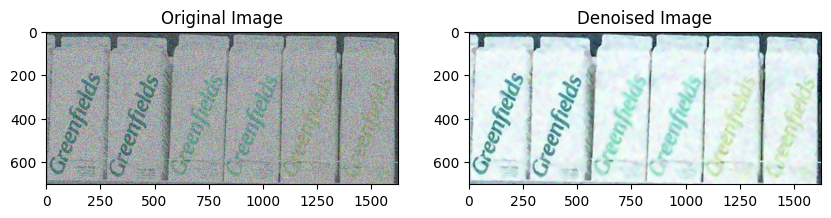

In [ ]:
train_exampleB = cv2.imread('dataset/scenes/scene12.png', cv2.IMREAD_COLOR)
train_exampleB = cv2.cvtColor(train_exampleB, cv2.COLOR_BGR2RGB)
denoised_train_exampleB = filter_image(train_exampleB)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(train_exampleB)
axes[0].set_title('Original Image')
axes[1].imshow(denoised_train_exampleB)
axes[1].set_title('Denoised Image')
plt.show()

## Loading model images and scene images

In [ ]:
imgs_query_task1B_rgb = []

for i in range(15, 28):
    img_query_bgr = cv2.imread(f'dataset/models/ref{i}.png', cv2.IMREAD_COLOR)
    img_query_rgb = cv2.cvtColor(img_query_bgr, cv2.COLOR_BGR2RGB)
    imgs_query_task1B_rgb.append(img_query_rgb)

imgs_train_task1B_rgb = []

for i in range(6, 13):
    img_train_bgr = cv2.imread(f'dataset/scenes/scene{i}.png', cv2.IMREAD_COLOR)
    img_train_rgb = cv2.cvtColor(img_train_bgr, cv2.COLOR_BGR2RGB)
    filtered_image = img_train_rgb
    filtered_image = filter_image(filtered_image)
    imgs_train_task1B_rgb.append(filtered_image)

## Multiple Object Retrieve Algorithm
"find_istances" function
 - for every scene tries template matching for every model image, each model image is scaled from 0.70 to 0.95 to find the right scale. The template matching threshold is set to 0.695 and only the scales that do some matches are kept. Then the best scale with the associated box is found increasing the number of matches requested at each iteration over a model image scale. So the fuction creates a list of best boxes for the model images found in a scene image.
 - Then it applies non-maxima suppression to filter out the overlapping boxes of the same object found.
 - The boxes that arrive at this point are then filtered based on the color difference with the function "color_filter". The difference between the mean color of the template and the mean color of the region of interest (roi) has to be less than a thershold.
 - Finally, given the boxes, we draw them in the scene image copy and calculate count, position, width and height.

In [ ]:
def color_filter(bounding_boxes, tuple, template, target_image):

    final_boxes = []

    # Mean color intensities of the template
    mean_template_color = np.mean(template, axis=(0, 1))

    for i, box in enumerate(bounding_boxes):
        x = box[0]
        y = box[1]
        width = abs(box[2] - x)
        height = abs(box[3] - y)

        # Region of interest (ROI)
        roi = target_image[y:y + height, x:x + width]

        # Mean color intensities of the ROI
        mean_roi_color = np.mean(roi, axis=(0, 1))

        # Difference between the mean colors of the ROI and the template
        color_difference = np.linalg.norm(mean_roi_color - mean_template_color)

        # Filter bounding boxes based on the threshold found empirically
        if color_difference < 25:
            final_boxes.append(((x,y), (box[2],box[3])))

    return final_boxes

In [ ]:
def distance_2_points(A, B):
    return math.sqrt( np.power(A[0] - B[0], 2) +  np.power(A[1] - B[1], 2))

def scale_template(template, train, scale):
    template_copy = template.copy()

    scale_factor = (train.shape[0] / template.shape[0]) * scale
    scaled_template = cv2.resize(template_copy, None, fx=scale_factor, fy=scale_factor)

    return scaled_template

def non_max_suppression(boxes, overlapThresh):
    if len(boxes) == 0:
        return []

    if boxes.dtype.kind == "i":
        boxes = boxes.astype("float")

    pick = []
    x1 = boxes[:,0]
    y1 = boxes[:,1]
    x2 = boxes[:,2]
    y2 = boxes[:,3]
    area = (x2 - x1 + 1) * (y2 - y1 + 1)
    idxs = np.argsort(y2)

    while len(idxs) > 0:
        last = len(idxs) - 1
        i = idxs[last]
        pick.append(i)
        xx1 = np.maximum(x1[i], x1[idxs[:last]])
        yy1 = np.maximum(y1[i], y1[idxs[:last]])
        xx2 = np.minimum(x2[i], x2[idxs[:last]])
        yy2 = np.minimum(y2[i], y2[idxs[:last]])
        w = np.maximum(0, xx2 - xx1 + 1)
        h = np.maximum(0, yy2 - yy1 + 1)
        overlap = (w * h) / area[idxs[:last]]

        idxs = np.delete(idxs, np.concatenate(([last], np.where(overlap > overlapThresh)[0])))

    return boxes[pick].astype("int")

In [ ]:
# Red, Green, Blue, Yellow, Cyan, Magenta, Gray, Maroon, Navy, Orange, Dark Green, Teal, Pink
colors = [
    (255, 0, 0),
    (0, 255, 0),
    (0, 0, 255),
    (255, 255, 0),
    (0, 255, 255),
    (255, 0, 255),
    (128, 128, 128),
    (128, 0, 0),
    (0, 0, 128),
    (255, 128, 0),
    (128, 128, 0),
    (0, 128, 128),
    (255, 192, 203)
]

def find_istances(imgs_train_rgb, imgs_query_rgb):

  results = {}
  final_scene = []

  for t, img_train in enumerate(imgs_train_rgb):
      single_scene = {}
      image = img_train.copy()

      for i, img_query in enumerate(imgs_query_rgb):
          single_scene[i] = {'count': 0, 'pos': [], 'width': [], 'height': []}
          image_detection = img_train.copy()
          template = img_query.copy()
          scales = [round(0.70 + j * 0.01, 2) for j in range(26)]  # List with values from 0.70 to 0.95
          best_scale = None
          max_matches = 0
          best_output = None
          best_template_scaled = None
          best_boxes = []
          color_box = colors[i]

          for scale in scales:
              template_scaled = scale_template(template, image_detection, scale)

              # Check if the scaled template is smaller than the image
              if template_scaled.shape[0] > image_detection.shape[0] or template_scaled.shape[1] > image_detection.shape[1]:
                  # Skip this scale if the template is too large
                  continue

              gray_image = cv2.cvtColor(image_detection, cv2.COLOR_BGR2GRAY)
              gray_template = cv2.cvtColor(template_scaled, cv2.COLOR_BGR2GRAY)

              w, h = gray_template.shape[::-1]

              # Perform template matching
              res = cv2.matchTemplate(gray_image, gray_template, cv2.TM_CCOEFF_NORMED)

              # Threshold for matching
              threshold = 0.695

              # Find locations with significant matches
              loc = np.where(res >= threshold)

              # Count the number of matches found
              num_matches = len(loc[0])

              # If the current scale has more matches than the previous ones, update the best scale and output image
              if num_matches > max_matches:
                  max_matches = num_matches

                  best_scale = scale
                  best_template_scaled = template_scaled.copy()
                  best_boxes = []

                  for pt in zip(*loc[::-1]):
                      best_boxes.append((pt[0], pt[1], pt[0] + w, pt[1] + h))

          if best_boxes:
              best_boxes = np.array(best_boxes)

              # Apply non-max suppression to filter overlapping boxes
              pick = non_max_suppression(best_boxes, overlapThresh=0.3).tolist()

              # Apply the "color_filter" function
              final_boxes = color_filter(pick, best_template_scaled, image_detection)

              single_scene[i]['count'] = len(final_boxes)

              # Draw the boxes and store position, width and height
              for top_left_corner, bottom_right_corner in final_boxes:
                  scene_final = cv2.rectangle(image, top_left_corner, bottom_right_corner, color_box, 15)
                  _ = cv2.rectangle(image_detection, top_left_corner, bottom_right_corner, color_box, 15)



                  top_right_corner = (bottom_right_corner[0], top_left_corner[1])

                  # Width and height of the bounding box
                  width_of_bounding_box = distance_2_points(top_left_corner, top_right_corner)
                  height_of_bounding_box = distance_2_points(top_right_corner, bottom_right_corner)

                  single_scene[i]['width'].append(width_of_bounding_box)
                  single_scene[i]['height'].append(height_of_bounding_box)
                  single_scene[i]['pos'].append((top_left_corner[0] + width_of_bounding_box/2, top_left_corner[1] + height_of_bounding_box/2))

      final_scene.append(image)
      results[str(t)] = single_scene

  return results, final_scene

In [ ]:
def print_resultB(results, idx_of_scene):
    for i in range(13):

        if results[idx_of_scene][i]['count'] == 0:
            continue

        print('Product {} - {} instance/s found:'.format(i, results[idx_of_scene][i]['count']))
        n = 0
        if results[idx_of_scene][i].get('width', None):
            found_instances = results[idx_of_scene][i].get('width')
            for index in range(len(found_instances)):
                n += 1
                print('\tInstance {} position: {}, width: {}px, height: {}px'.format(n, results[idx_of_scene][i]['pos'][index], results[idx_of_scene][i]['width'][index], results[idx_of_scene][i]['height'][index]))
    print('_' * 80 + '\n')

In [ ]:
def format_results_for_evaluation(results):
  list_results = {}
  for s, d in results.items():
    list_results[s] = []
    for i in range(len(imgs_query_task1B_rgb)):
      if results[s][i]:
        list_results[s].append(d[i]['count'])
      else:
        list_results[s].append(0)
  return list_results

In [ ]:
def evaluate_resultsB(results, optimal):
  formatted_results = {}
  for s, d in results.items():
    formatted_results[s] = []
    for i in range(len(imgs_query_task1B_rgb)):
      if results[s][i]:
        formatted_results[s].append(d[i]['count'])
      else:
        formatted_results[s].append(0)

  # Calculate the number of boxes to find for each scene
  li_optimal = []
  for l in optimal.keys():
      li_optimal.append(sum(optimal[l]))

  boxes_to_find = sum(li_optimal)

  # Calculate the number of boxes found in each scene and the error wrt the optimal result
  li_results = []
  li_errors = []
  for l in results.keys():
      diff = [np.abs(optimal[l][g] - formatted_results[l][g]) for g in range(len(optimal[l]))]
      li_results.append(sum(formatted_results[l]))
      li_errors.append(sum(diff))

  # Total number of boxes found, total error and accuracy wrt the number of boxes to find optimally
  errors = sum(li_errors)
  found_boxes = sum(li_results)
  accuracy = 1 - (errors / boxes_to_find)

  print(f'Number of errors = {errors}')
  print(f'Number of boxes found = {found_boxes}')
  print(f'Number of boxes to find = {boxes_to_find}')
  print(f'Accuracy = {accuracy}')

## Results and the achieved score

In [ ]:
resultsB, final_scene = find_istances(imgs_train_task1B_rgb, imgs_query_task1B_rgb)

for j in range(7):
  print_resultB(resultsB, str(j))

Product 0 - 2 instance/s found:
	Instance 1 position: (590.5, 643.0), width: 309.0px, height: 858.0px
	Instance 2 position: (184.5, 643.0), width: 309.0px, height: 858.0px
________________________________________________________________________________

Product 1 - 2 instance/s found:
	Instance 1 position: (1032.0, 467.5), width: 216.0px, height: 597.0px
	Instance 2 position: (797.0, 467.5), width: 216.0px, height: 597.0px
________________________________________________________________________________

Product 2 - 2 instance/s found:
	Instance 1 position: (989.5, 581.0), width: 325.0px, height: 852.0px
	Instance 2 position: (650.5, 576.0), width: 325.0px, height: 852.0px
Product 8 - 2 instance/s found:
	Instance 1 position: (988.0, 574.0), width: 320.0px, height: 862.0px
	Instance 2 position: (647.0, 568.0), width: 320.0px, height: 862.0px
Product 9 - 2 instance/s found:
	Instance 1 position: (1340.0, 587.0), width: 324.0px, height: 842.0px
	Instance 2 position: (984.0, 584.0), width:

In [ ]:
# dictionary with the optimal result
GROUND_TRUTH_B = {
    '0': [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    '1': [0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    '2': [0, 0, 2, 0, 0, 0, 0, 0, 2, 1, 0, 0, 1],
    '3': [0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0],
    '4': [0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0],
    '5': [0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 3, 0, 0],
    '6': [0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2]
}

evaluate_resultsB(resultsB, GROUND_TRUTH_B)

Number of errors = 4
Number of boxes found = 35
Number of boxes to find = 35
Accuracy = 0.8857142857142857


We achieve a very high score considering the noise in the scene images and the small difference between certain images.<br>
The errors that we do are:
- we found two yellow soya boxes instead of one in the third scene. That is because the color difference with the blue soya model is very low and we could not filter it out.
- we did not find the greenfield box in the third scene, that is due to the fact that the box is slightly stretched in width and the color is not well recognizable.
- we did not find one of the two yellow soya boxes on the sixth scene, the box we could not locate is partially obscured with a sign.
- we found an additional greenfield box on the seventh scene image making a repetition, therefore an error. This error is due to the fact that greenfield white boxes are very similar in shape and color.

<br>

Below we can see all the scene images with the bounding boxes and therefore the erros in the scene images.

SCENE 0


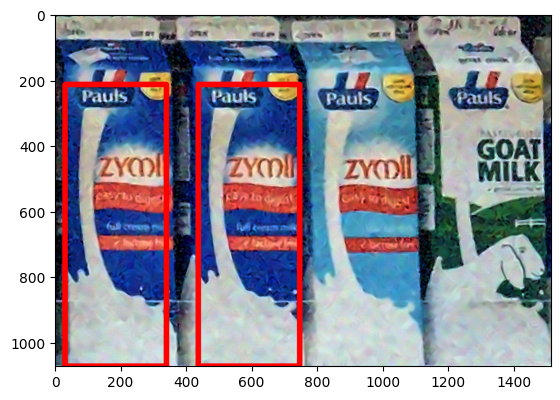

SCENE 1


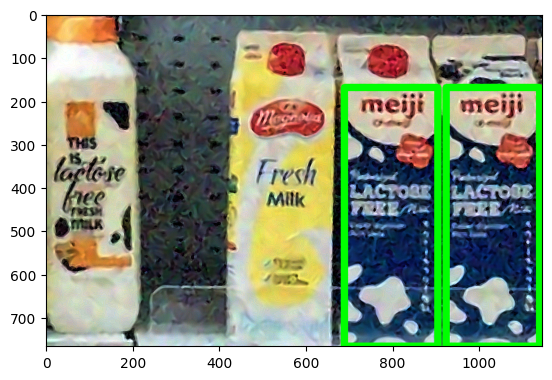

SCENE 2


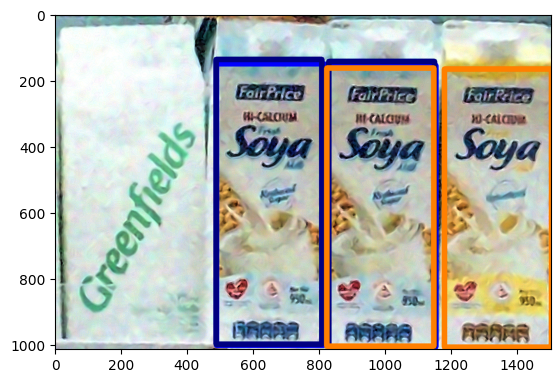

SCENE 3


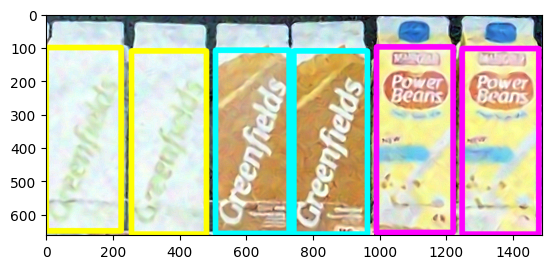

SCENE 4


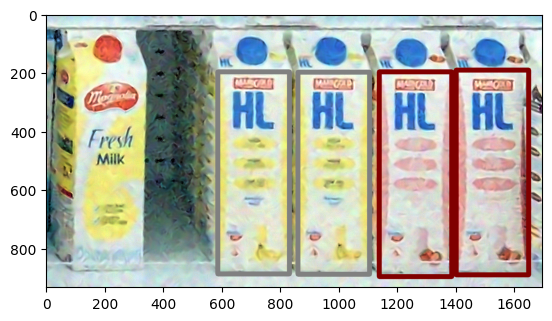

SCENE 5


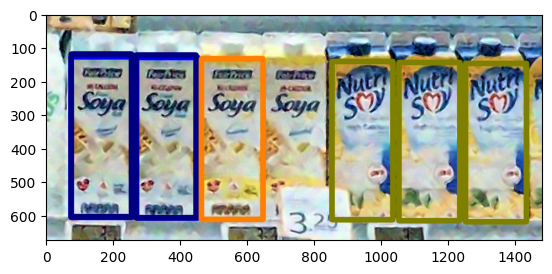

SCENE 6


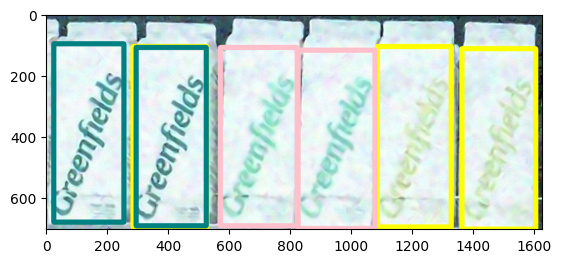

In [ ]:
for i in range(7):
  print("SCENE", i)
  plt.imshow(final_scene[i])
  plt.show()